In [1]:
%load_ext autoreload
%autoreload 2

In [1]:
import flash_attn
flash_attn.__version__

AttributeError: module 'flash_attn' has no attribute '__version__'

In [2]:
#!pip install flash-attn

In [3]:
from kandinsky_bf16 import monkey_patch_bf16

go_for_bfloat16 = False
if go_for_bfloat16:
    model.model = monkey_patch_bf16(model.model)

/home/anton/.local/lib/python3.8/site-packages/pkg_resources/__init__.py:123: PkgResourcesDeprecationWarning: 0.23ubuntu1 is an invalid version and will not be supported in a future release
  warnings.warn(
/home/anton/.local/lib/python3.8/site-packages/pkg_resources/__init__.py:123: PkgResourcesDeprecationWarning: 0.1.36ubuntu1 is an invalid version and will not be supported in a future release
  warnings.warn(


In [4]:
from kandinsky_imagine import ImagineKandinsky
imagine = ImagineKandinsky()

making attention of type 'vanilla' with 512 in_channels
making attention of type 'vanilla' with 512 in_channels
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.


In [5]:
neg_prompt = "ugly, tiling, oversaturated, undersaturated, poorly drawn hands, poorly drawn feet, poorly drawn face, out of frame, extra limbs, disfigured, deformed, body out of frame, blurry, bad anatomy, blurred, watermark, grainy, signature, cut off, draft"

In [6]:
prompt1 = "HD nature photography of a frog leaping in a pond"
prompt = "A wizard in blue robes is painting a red painting in a castle"
prompt = "A llama wearing a scarf and glasses is sitting in a cozy cafe and reading a book"
#prompt = "A time traveller in a crowd"

prompt2 = "A wizard in blue robes is painting a red painting in a castle"

In [7]:
#from PIL import Image
#antcar = Image.open("IMG_20220522_143926_1.jpg")

In [42]:
import torch
torch.cuda.empty_cache()

torch.Size([2, 77, 1024]) torch.Size([2, 768]) torch.Size([2, 768])
Startup time required:  0.0


DDIM Sampler: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████| 19/19 [00:00<00:00, 19.35it/s]


Time required:  1.1


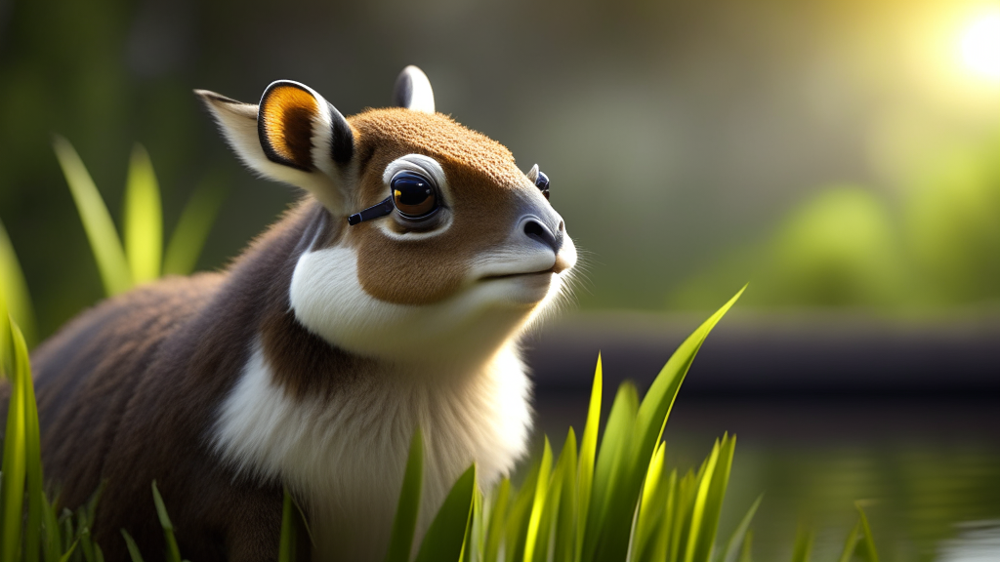

In [43]:
inputs = [prompt1, prompt]
weights = [1.0, 1.0]

#inputs = "A dog", "sad", img_1
#weights = [1.0, 0.0, 2.0]
text_emb, image_emb = imagine.embed_inputs(inputs,
                                            weights=weights,
                                            batch_size=1,
                                            prior_cf_scale=2, 
                                            prior_steps="2", 
                                            negative_prior_prompt=neg_prompt,
                                            negative_decoder_prompt=neg_prompt)

print(text_emb[0].shape, text_emb[1].shape, image_emb.shape)

imagine.move_encoders("cpu")

img_2 = imagine.gen_img(
            seed=1011,
            guidance_scale=4,
            sampler = "ddim_sampler",
            #sampler = "p_sampler",
            w=1024,
            h=576,
            num_steps=18,
            text_emb = text_emb,
            image_emb=image_emb)
img_2

torch.Size([2, 77, 1024]) torch.Size([2, 768]) torch.Size([2, 768])
Startup time required:  0.0


DDIM Sampler: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████| 19/19 [00:00<00:00, 20.89it/s]


Time required:  1.0


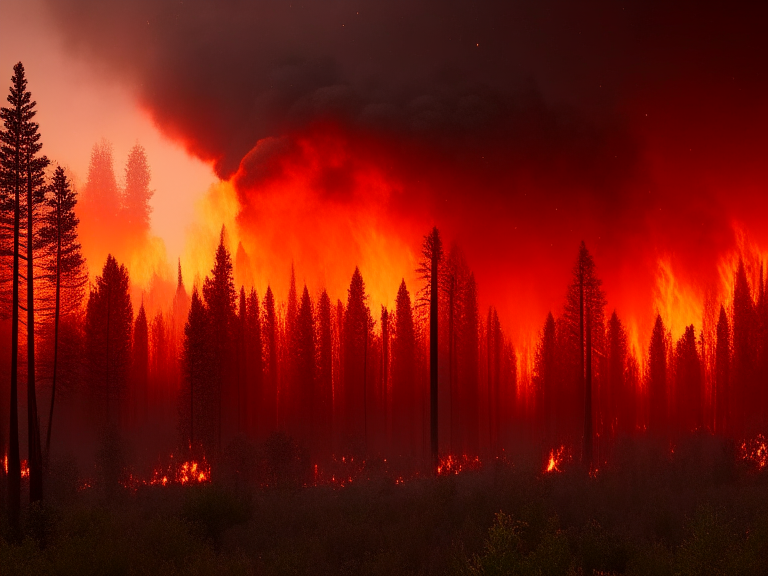

In [11]:
text_emb, image_emb = imagine.embed_inputs(["WILDFIRES"],
                                           weights=[1],
                                         batch_size=1,
                                         prior_cf_scale=2, 
                                         prior_steps="2", 
                                         negative_prior_prompt=neg_prompt,
                                         negative_decoder_prompt=neg_prompt)

print(text_emb[0].shape, text_emb[1].shape, image_emb.shape)

img_1 = imagine.gen_img(
            seed=10111,
            guidance_scale=4,
            sampler = "ddim_sampler",
            #sampler = "p_sampler",
            num_steps=18,
            text_emb = text_emb,
            image_emb=image_emb)
img_1

Startup time required:  0.04


DDIM Sampler: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████| 19/19 [00:00<00:00, 22.39it/s]


Time required:  0.97


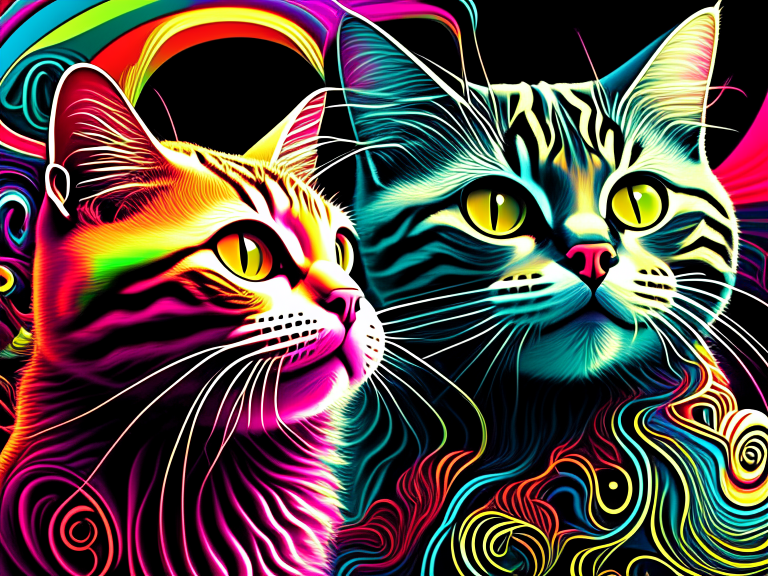

In [150]:

img_1 = imagine.gen_img(
    prompt=prompt,
    #prompt="Woman with a big braid in colored water",
            seed=10111,
            guidance_scale=4,
            sampler = "ddim_sampler",
            #sampler = "p_sampler",
            num_steps=18,
            prior_steps="2",
            prior_cf_scale=2,
            negative_decoder_prompt=neg_prompt)
img_1

Init img shape:  torch.Size([1, 3, 576, 768])
Encoded img shape:  torch.Size([2, 4, 72, 96])
Start step:  300
Startup time required:  0.08


DDIM Sampler: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████| 19/19 [00:00<00:00, 22.64it/s]


Time required:  1.0


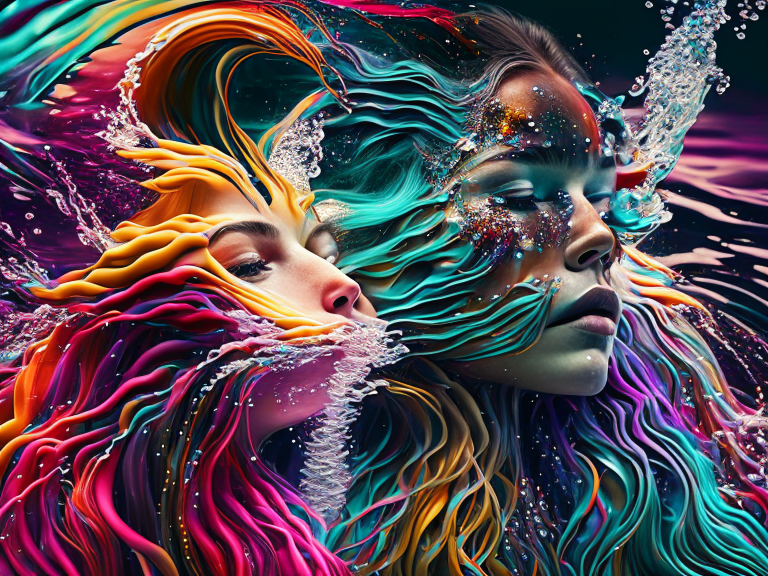

In [153]:
prompt2 = "Woman with a big braid in colored water"
img_2 = imagine.gen_img(prompt=prompt2,
            seed=1011,
            guidance_scale=4,
            sampler = "ddim_sampler",
            #sampler = "p_sampler",
            num_steps=18,
            prior_steps="2",
            prior_cf_scale=2,
            negative_decoder_prompt=neg_prompt,
            init_img=img_1,
            strength=0.7,
                       )
img_2

In [69]:
torch.cuda.empty_cache()

In [72]:
model.model.convert_to_bf16()
model.model.dtype = torch.bfloat16

Startup time required:  0.04
None


DDIM Sampler: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████| 19/19 [00:00<00:00, 22.49it/s]


Time required:  0.97


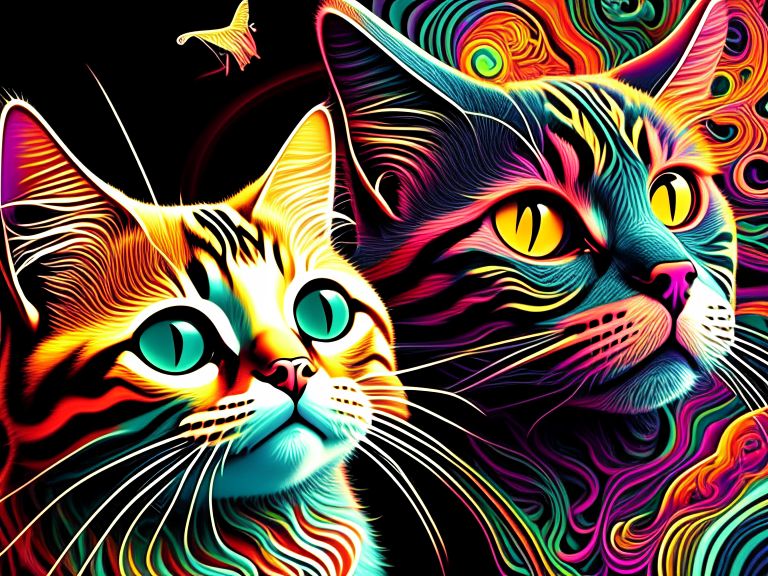

In [75]:
#neg_prompt = "ugly, tiling, poorly drawn hands, poorly drawn feet, poorly drawn face, out of frame, extra limbs, disfigured, deformed, body out of frame, bad anatomy, watermark, signature, cut off, low contrast, underexposed, overexposed, bad art, beginner, amateur, distorted face"

prompt = "Cats on LSD."


img = gen_img(prompt=prompt,
            seed=1011,
            guidance_scale=4,
            sampler = "ddim_sampler",
            #sampler = "p_sampler",
            num_steps=18,
            prior_steps="2",
            prior_cf_scale=2,
            negative_decoder_prompt=neg_prompt)
img

In [44]:
import torch
torch.__version__

'2.0.0+cu118'

In [653]:
round(5 / (1 - 0.95)) * (1- 0.95)

5.000000000000004

Init img shape:  torch.Size([1, 3, 576, 768])
Encoded img shape:  torch.Size([2, 4, 72, 96])
Start step:  500
Startup time required:  0.08
500


DDIM Sampler: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10/10 [00:00<00:00, 17.61it/s]


Time required:  0.73


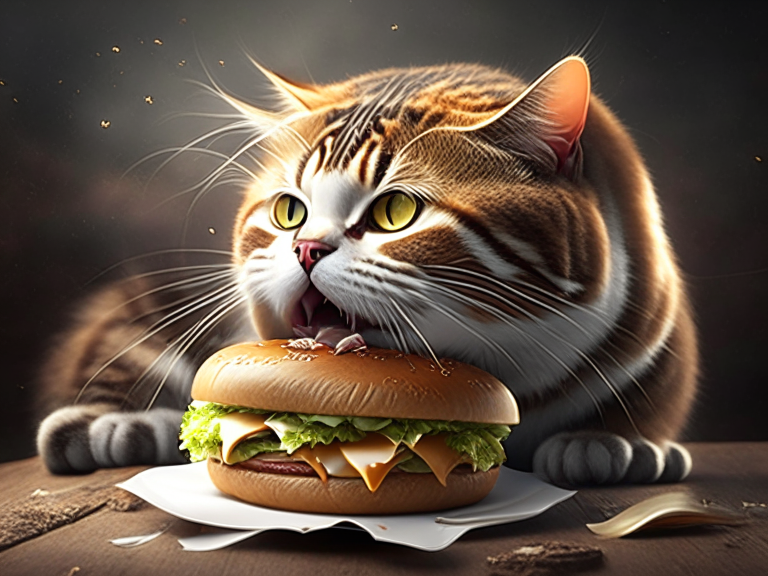

In [691]:
import torchvision

new_prompt = "A cat eating a burger of death"
img2 = gen_img(prompt=new_prompt,
            seed=1011,
            guidance_scale=4,
            sampler = "ddim_sampler",
            #sampler = "p_sampler",
            num_steps=10,
            prior_steps="2",
            prior_cf_scale=2,
            negative_decoder_prompt=neg_prompt,
    
            init_img=img, #torchvision.transforms.ToTensor()(img),
            #init_step=1200,
            strength=0.5,
            )
img2

1000 400


DDIM Sampler: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 17.35it/s]


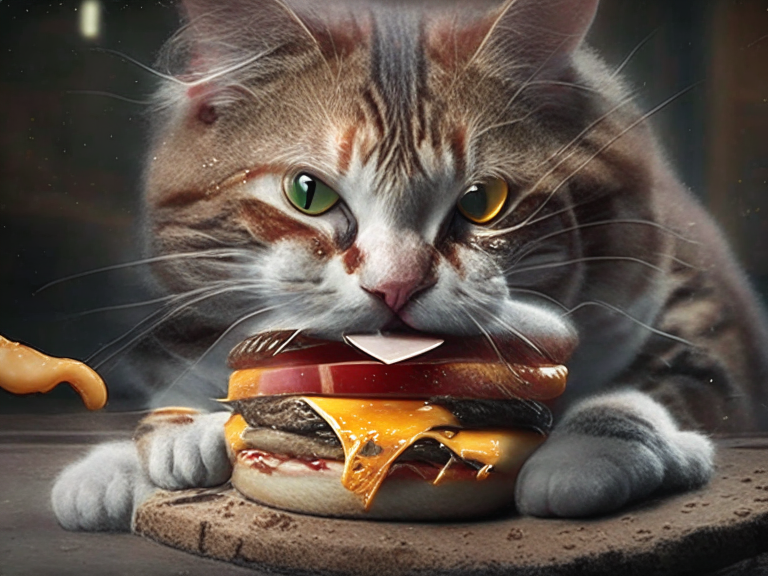

In [657]:
img3 = model.generate_img2img(new_prompt,
                              img,
                              strength=0.6,
                              num_steps=20,
                              guidance_scale=4,
                              w=768,
                              h=576,
                             #sampler = "p_sampler",
                             sampler = "ddim_sampler",
                             prior_steps="2",
                             prior_cf_scale=2,
                )[0]
img3

1000 199


DDIM Sampler: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 17.16it/s]


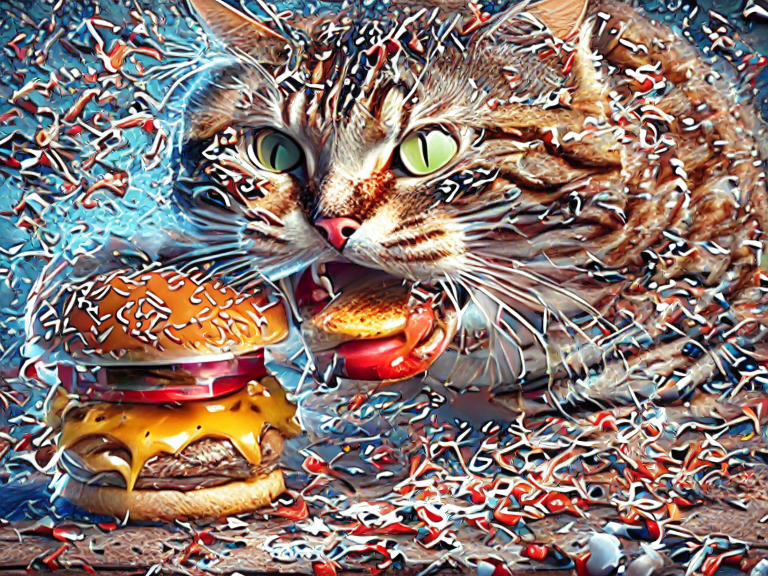

In [578]:
new_prompt = "Cat eating burger"


img3 = model.generate_img2img(new_prompt,
                              img3,
                              strength=0.8,
                              num_steps=20,
                              guidance_scale=4,
                              w=768,
                              h=576,
                              #sampler = "p_sampler",
                              sampler = "ddim_sampler",
                              prior_steps="2",
                              prior_cf_scale=2,
                )[0]
img3

Startup time required:  0.04


  0%|          | 0/30 [00:00<?, ?it/s]

Time required:  1.86


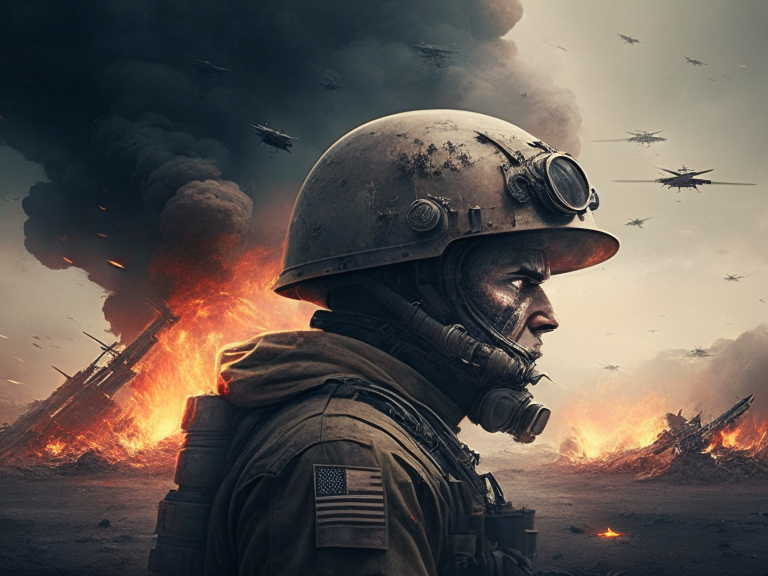

In [56]:
prompt = "WAR."


img = gen_img(prompt=prompt,
            seed=1011,
            guidance_scale=4,
            sampler = "p_sampler",
            num_steps=30,
            prior_steps="2",
            prior_cf_scale=2,
            negative_decoder_prompt=neg_prompt)
img

In [107]:
#neg_prompt = ""

prompts = ["An oil painting of cats playing on the moon. 4K, trending on artstation, masterpiece, stunning",
           "Consciousness of cats",
           "A photo of Carmen in a cool dress singing next to a piano on a sail cruise. 4K, HD, HDR.",
           "Beautiful lady",
           "Ginger rave Nadia Burke working hard on a useless product",
           "Cats on Mars",
           "A wizard in blue robes is painting a red painting in a castle"]

#prompt = "A frog sticking out its tongue. Stunning lighting"
scales = list(range(5, 30, 1))



imgs = []
#for scale in scales:
#    print(scale)
for p in prompts:
    img = gen_img(prompt=p,
            seed=1011110,
            guidance_scale=4,
            sampler = "ddim_sampler",
            #sampler = "p_sampler",
            #sampler = "plms_sampler",
            num_steps=50,
            prior_steps="2",
            prior_cf_scale=2,
            negative_decoder_prompt=neg_prompt)
    imgs.append(img)


Startup time required:  0.05


DDIM Sampler: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:02<00:00, 17.62it/s]


Time required:  2.97
Startup time required:  0.04


DDIM Sampler: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:02<00:00, 17.68it/s]


Time required:  2.95
Startup time required:  0.04


DDIM Sampler: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:02<00:00, 17.68it/s]


Time required:  2.95
Startup time required:  0.04


DDIM Sampler: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:02<00:00, 17.68it/s]


Time required:  2.95
Startup time required:  0.04


DDIM Sampler: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:02<00:00, 17.67it/s]


Time required:  2.95
Startup time required:  0.04


DDIM Sampler: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:02<00:00, 17.67it/s]


Time required:  2.95
Startup time required:  0.04


DDIM Sampler: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:02<00:00, 17.68it/s]

Time required:  2.95


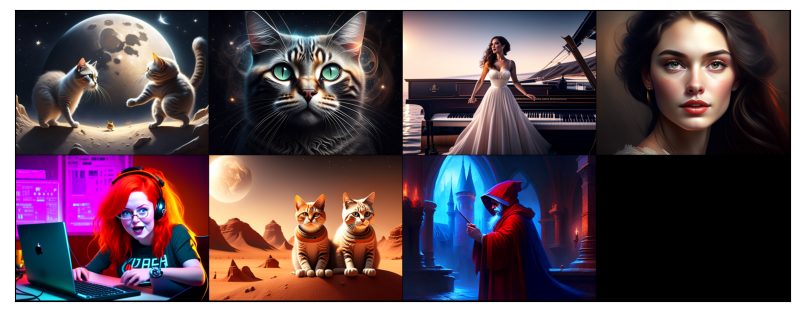

In [82]:
grid = torchvision.utils.make_grid([torchvision.transforms.ToTensor()(img) for img in imgs], nrow=4)
show(grid)

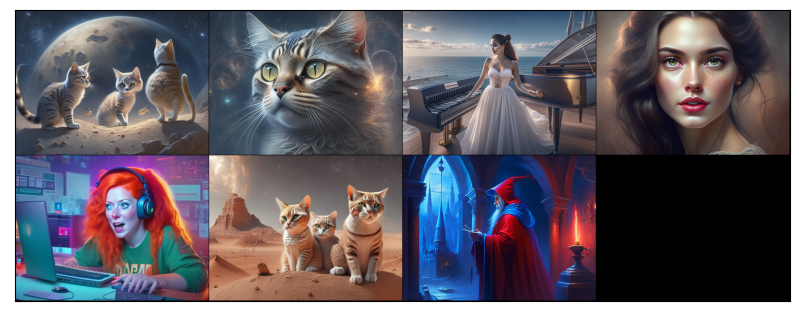

In [84]:
grid = torchvision.utils.make_grid([torchvision.transforms.ToTensor()(img) for img in imgs], nrow=4)
show(grid)

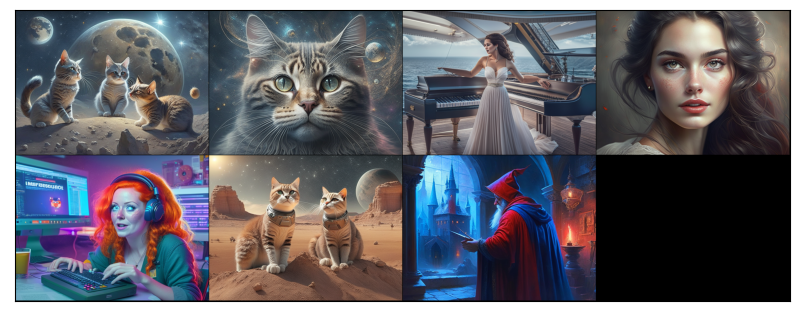

In [98]:
grid = torchvision.utils.make_grid([torchvision.transforms.ToTensor()(img) for img in imgs], nrow=4)
show(grid)

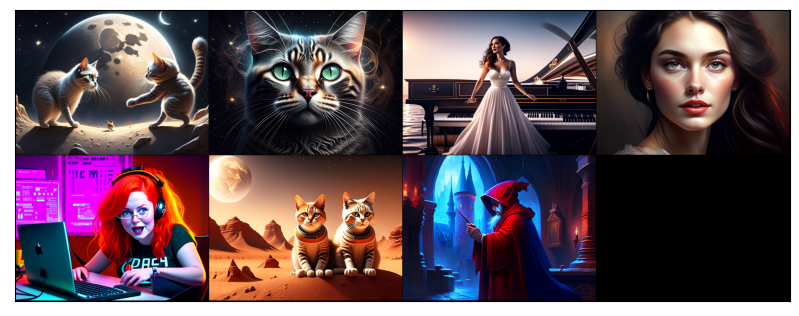

In [108]:
grid = torchvision.utils.make_grid([torchvision.transforms.ToTensor()(img) for img in imgs], nrow=4)
show(grid)

In [58]:
np.array(scales)

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19])

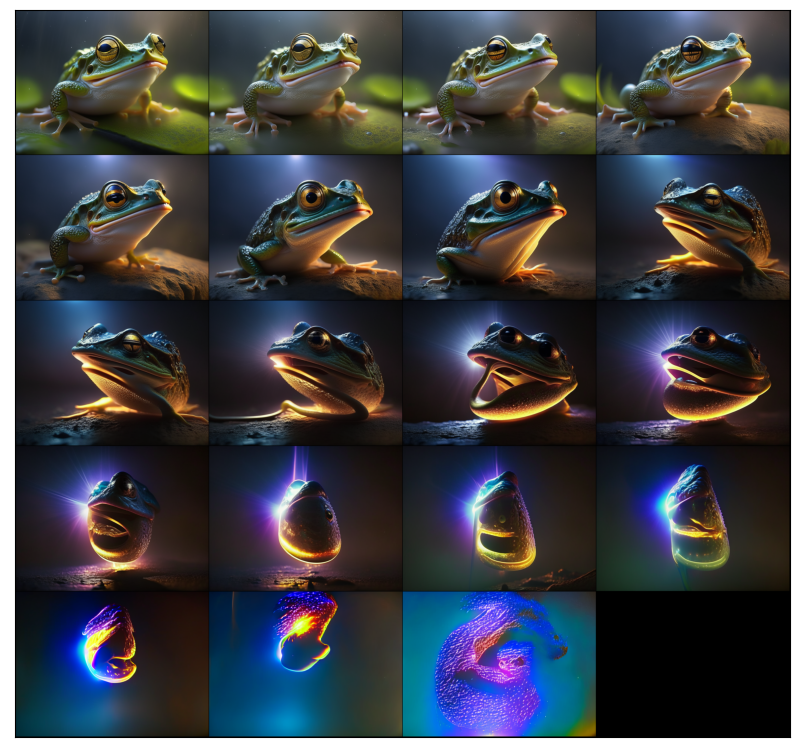

In [59]:
import torch
import numpy as np
import matplotlib.pyplot as plt

import torchvision.transforms.functional as F


plt.rcParams["savefig.bbox"] = 'tight'
def show(imgs):
    if not isinstance(imgs, list):
        imgs = [imgs]
    fig, axs = plt.subplots(ncols=len(imgs), squeeze=False, figsize=(10,10))
    for i, img in enumerate(imgs):
        img = img.detach()
        img = F.to_pil_image(img)
        axs[0, i].imshow(np.asarray(img))
        axs[0, i].set(xticklabels=[], yticklabels=[], xticks=[], yticks=[])
        
import torchvision
grid = torchvision.utils.make_grid([torchvision.transforms.ToTensor()(img) for img in imgs], nrow=4)
show(grid)

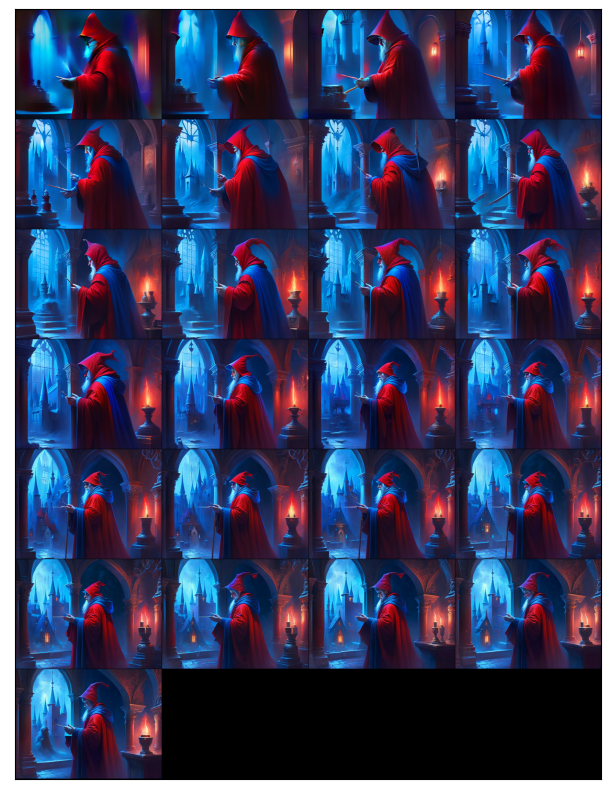

In [73]:
grid = torchvision.utils.make_grid([torchvision.transforms.ToTensor()(img) for img in imgs], nrow=4)
show(grid)

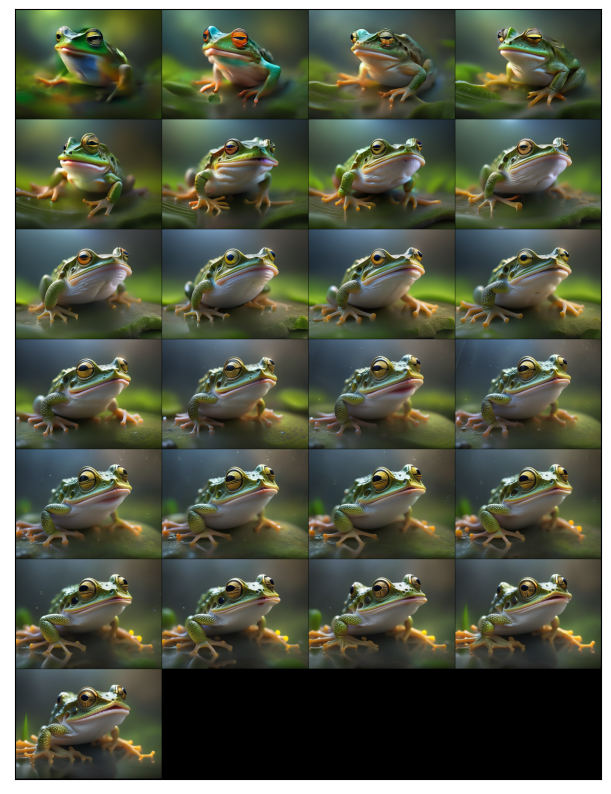

In [66]:
grid = torchvision.utils.make_grid([torchvision.transforms.ToTensor()(img) for img in imgs], nrow=4)
show(grid)

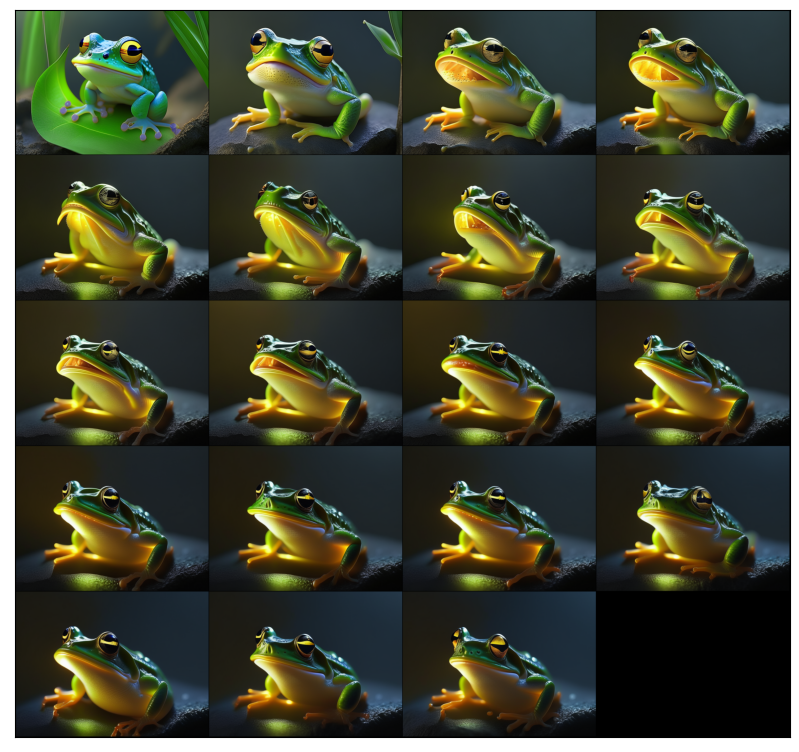

In [61]:
grid = torchvision.utils.make_grid([torchvision.transforms.ToTensor()(img) for img in imgs], nrow=4)
show(grid)

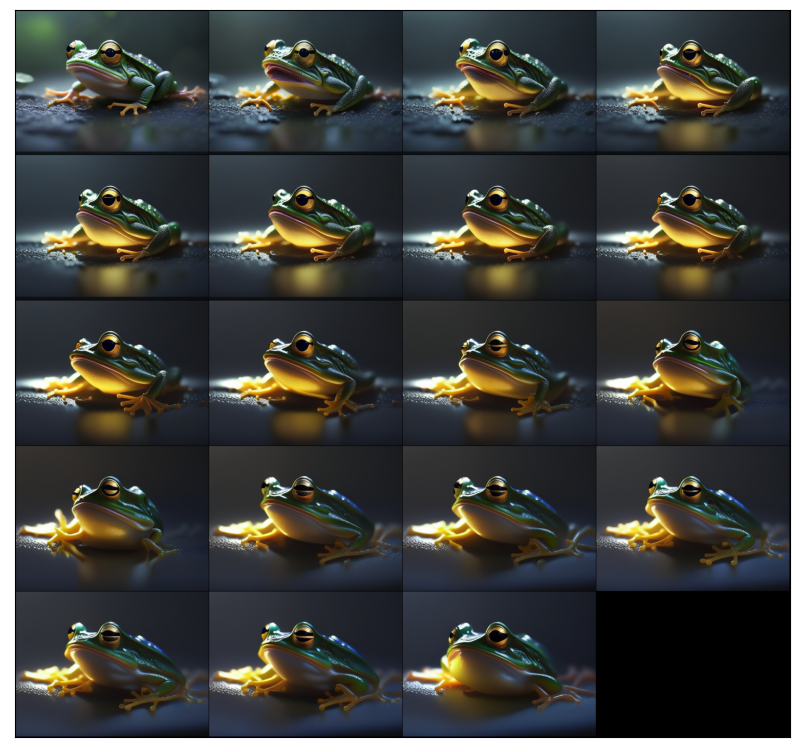

In [63]:
grid = torchvision.utils.make_grid([torchvision.transforms.ToTensor()(img) for img in imgs], nrow=4)
show(grid)

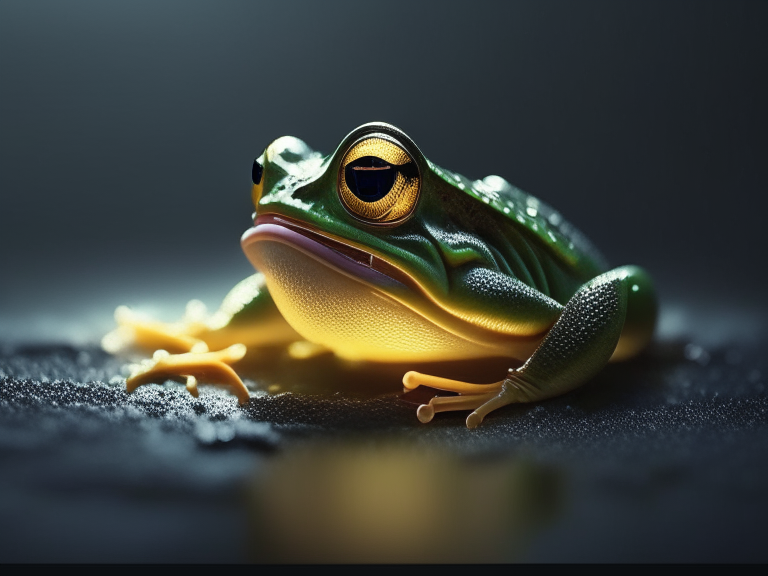

In [64]:
imgs[3]